# Import packages and data 

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scipy.stats
import anndata
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.axes._axes import _log as matplotlib_axes_logger
from scipy import sparse
matplotlib_axes_logger.setLevel('ERROR')
# silence NumbaPerformanceWarning
import warnings
from numba.errors import NumbaPerformanceWarning
warnings.filterwarnings("ignore", category=NumbaPerformanceWarning)

/Users/b8058304/.pyenv/versions/3.6.4/envs/py36/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


In [2]:
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
# Set up the plot config for viewing the annotation clearly.
sc.settings.set_figure_params(dpi=120, dpi_save=1000)
sc.logging.print_versions()

scanpy==1.4.4 anndata==0.7.1 umap==0.3.10 numpy==1.18.1 scipy==1.4.1 pandas==1.0.2 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1


# Load the FL progenitors

In [3]:
adata = sc.read('/Users/b8058304/Documents/PhD_work/Coding/liver/data/fetal_liver_alladata_Copy1.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 113063 × 27080 
    obs: 'nGene', 'nUMI', 'orig.ident', 'percent.mito', 'fetal.ids', 'sort.ids', 'tissue', 'lanes', 'stages', 'sample.type', 'gender', 'AnnatomicalPart', 'doublets', 'cell.labels', 'combined.labels', 'batch', 'sample', 'n_counts'
    obsm: 'X_fdg', 'X_tsne', 'X_umap'

In [5]:
adata.raw = adata

In [6]:
cell_numbers = adata.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
B cell                            1079
DC1                                336
DC2                               3954
DC precursor                       330
Early Erythroid                  11985
Early lymphoid_T lymphocyte        767
Endothelial cell                  3348
Fibroblast                        1713
HSC_MPP                           3439
Hepatocyte                        2479
ILC precursor                     1726
Kupffer Cell                     24841
Late Erythroid                    3180
MEMP                              1342
Mast cell                         1308
Megakaryocyte                     3983
Mid Erythroid                    27000
Mono-Mac                          6590
Monocyte                          2586
Monocyte precursor                 350
NK                                6706
Neutrophil-myeloid progenitor      658
Pre pro B cell                     234
VCAM1+ EI macrophage               161
pDC precursor                      253
pre-B cell   

In [7]:
adata = adata[adata.obs['cell.labels'].isin(['HSC_MPP', 'Pre pro B cell', 'MEMP'])].copy()

In [8]:
cell_numbers = adata.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
HSC_MPP           3439
MEMP              1342
Pre pro B cell     234
dtype: int64

# Pre-process the FL progenitor dataset

In [9]:
# normalise count data 
sc.pp.normalize_total(adata)

In [10]:
# log the count data 
sc.pp.log1p(adata)

In [11]:
adata

AnnData object with n_obs × n_vars = 5015 × 27080 
    obs: 'nGene', 'nUMI', 'orig.ident', 'percent.mito', 'fetal.ids', 'sort.ids', 'tissue', 'lanes', 'stages', 'sample.type', 'gender', 'AnnatomicalPart', 'doublets', 'cell.labels', 'combined.labels', 'batch', 'sample', 'n_counts'
    obsm: 'X_fdg', 'X_tsne', 'X_umap'

In [12]:
# find variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5) 

In [13]:
# scale the data 
sc.pp.scale(adata, max_value=10)

In [14]:
# scale the negative values in adata.X (which have been normalised, logged and scaled) to zero 
adata.X = np.where(adata.X < 0, 0, adata.X)

In [15]:
# run pca
sc.tl.pca(adata, n_comps=50)

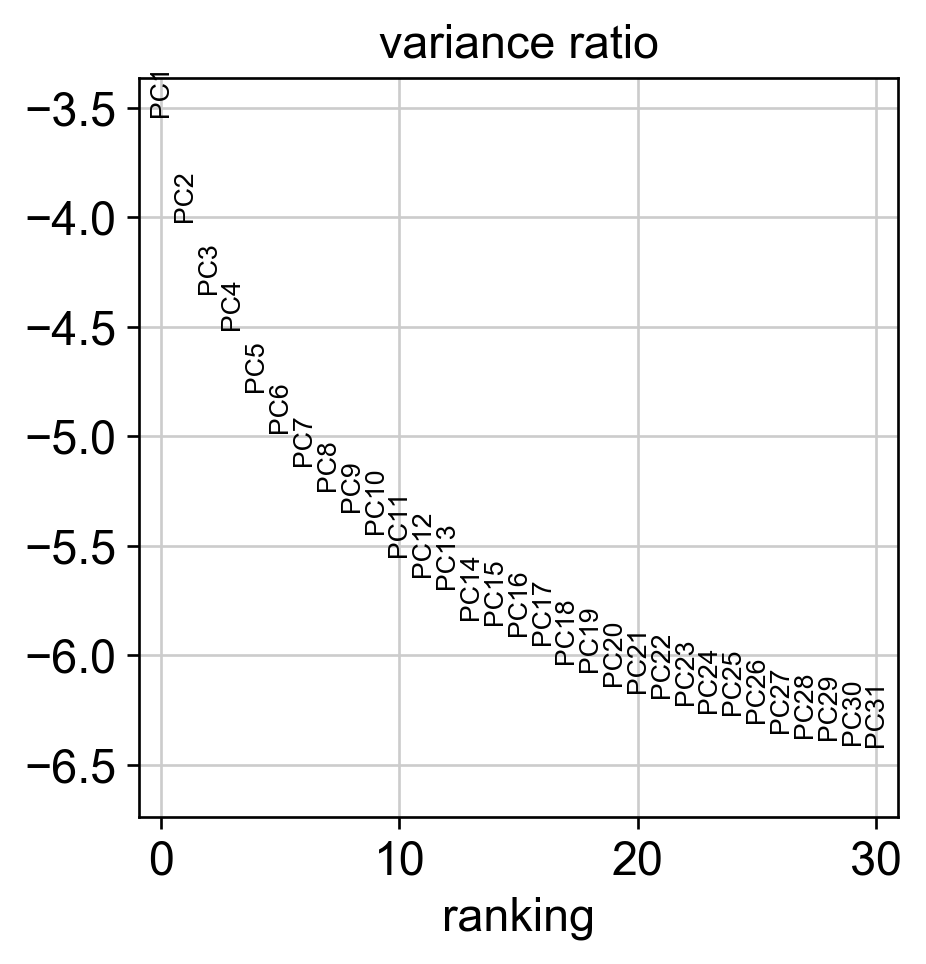

In [16]:
# have a look at pc's in order to choose number of pcs that will be used downstream 
sc.pl.pca_variance_ratio(adata, log=True)

In [17]:
# run snn neighbourhood graph
sc.pp.neighbors(adata, n_neighbors=40, n_pcs=10) 

In [18]:
# run umap
sc.tl.umap(adata) 

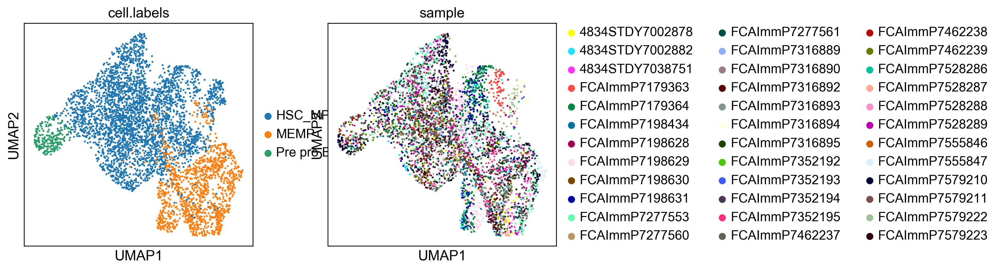

In [19]:
sc.pl.umap(adata, color=['cell.labels', 'sample'], size=15) 

# Run harmony batch correction

In [20]:
#harmony prep - save pca and batch (sample) metadata columns 
pca = adata.obsm['X_pca']
batch = adata.obs['sample']

In [21]:
# load up harmony in rpy2
%load_ext rpy2.ipython

/Users/b8058304/.pyenv/versions/3.6.4/envs/py36/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:34: UserWarning: pandas >= 1.0 is not supported.
  warnings.warn('pandas >= 1.0 is not supported.')


In [22]:
%%R -i pca -i batch -o hem

library(harmony)
library(magrittr)

hem = HarmonyMatrix(pca, batch, theta=3, verbose=TRUE, do_pca=FALSE)
hem = data.frame(hem)

R[write to console]: Loading required package: Rcpp

R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[

R[write to console]: Harmony 7/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write t

In [23]:
# save old pca values or orig.pca and save batch corrected pca results in anndata object as x_pca
adata.obsm['X_orig_pca'] = adata.obsm['X_pca']
adata.obsm['X_pca'] = hem.values

# Add dimensional reduction post-harmony

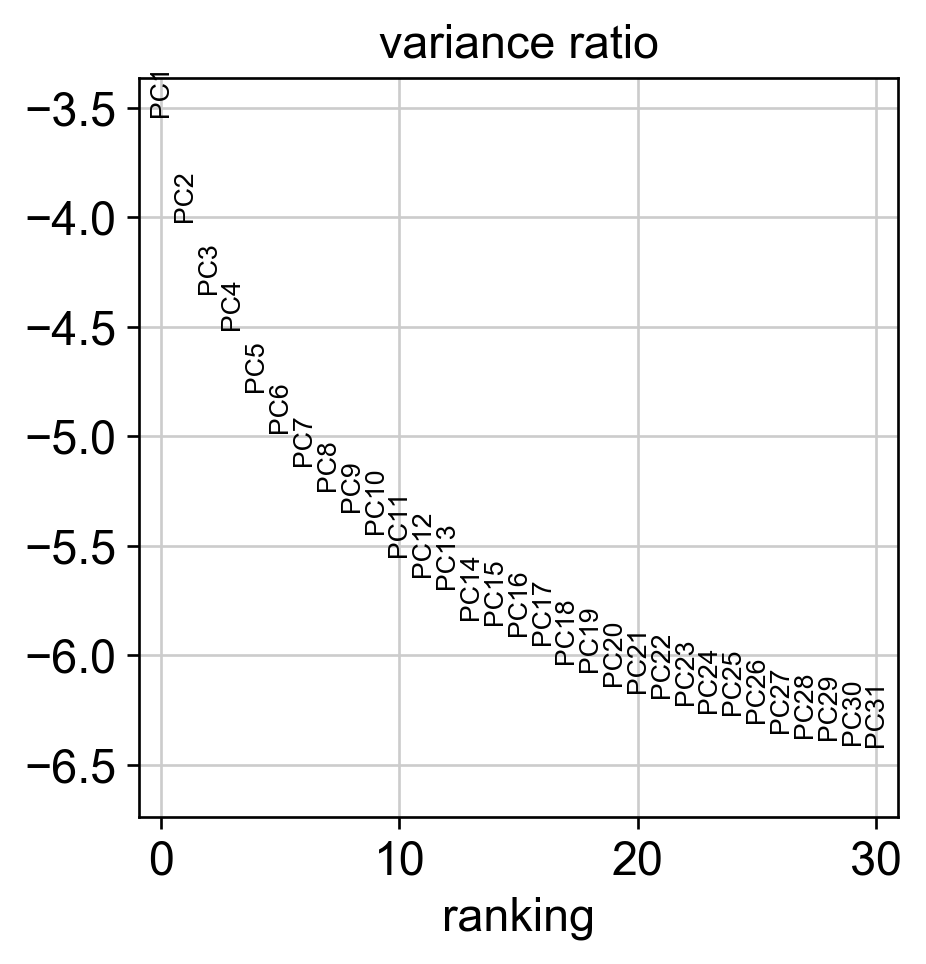

In [24]:
# have a look at pc's in order to choose number of pcs that will be used downstream 
sc.pl.pca_variance_ratio(adata, log=True)

In [25]:
# run snn neighbourhood graph
sc.pp.neighbors(adata, n_neighbors=40, n_pcs=30) 

In [26]:
# run umap
sc.tl.umap(adata)

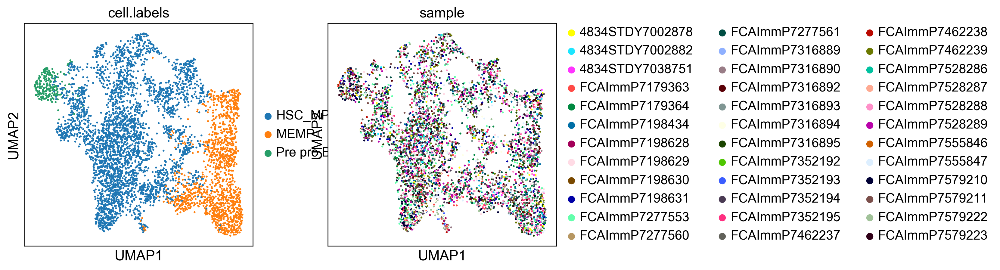

In [27]:
sc.pl.umap(adata, color=['cell.labels', 'sample'], size=15) 

# Cluster FL progenitor to around 20 groups

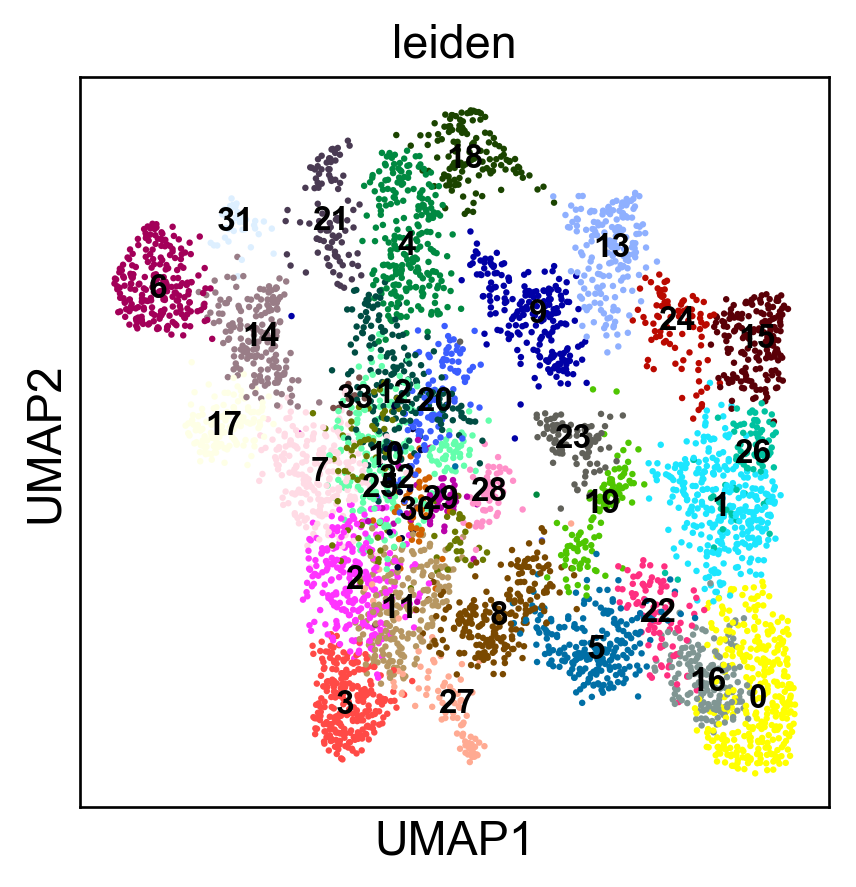

In [28]:
sc.tl.leiden(adata, resolution=3, random_state=26, n_iterations=-1) 
sc.pl.umap(adata, color='leiden', legend_loc="on data", size=15, legend_fontsize=10)

In [29]:
cell_numbers = adata.obs.groupby(["leiden"]).apply(len)
cell_numbers

leiden
0     333
1     310
2     264
3     242
4     236
5     223
6     223
7     216
8     212
9     207
10    201
11    201
12    185
13    177
14    172
15    170
16    159
17    130
18    126
19    109
20     97
21     94
22     89
23     86
24     84
25     82
26     81
27     81
28     55
29     54
30     44
31     41
32     17
33     14
dtype: int64

In [30]:
scrna_data = adata

# Run DEGs for FL progen

In [31]:
# scale the data 
sc.pp.scale(adata, max_value=10)

In [32]:
# scale the negative values in adata.X (which have been normalised, logged and scaled) to zero 
adata.X = np.where(adata.X < 0, 0, adata.X)

In [33]:
# run degs on normalised and logged data (saved as adata.raw), not on additionally scaled data (saved as adata.X).
# calculate degs using wilcoxon rank sum test with benjamini-hochberg correction. 
#based on ln transformed count data 
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon', use_raw=False, log_transformed=True)

In [34]:
# filter the degs for those which are expressed in at least 25% of cells in cluster. log2fc of the ln-transformed
# data will be shown.
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.25, min_fold_change=0.25, use_raw=False)

In [35]:
# save df for unfiltered degs
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
degs_by_cluster = pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges']})

# the degs_by_cluster df shows the log2 fold change for each gene ordered by z-score underlying the computation 
# of a p-value for each gene for each group
degs_by_cluster.to_csv("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/figs/clustering_degs/fl_progen_degs.csv")
degs_by_cluster[:10]

,0_n,0_l,1_n,1_l,2_n,2_l,3_n,3_l,4_n,4_l,...,29_n,29_l,30_n,30_l,31_n,31_l,32_n,32_l,33_n,33_l
0,S100A6,4.392470,DUT,3.265562,HOPX,2.130163,MLLT3,4.306446,MPO,5.406427,...,HNRNPH1,3.771995,ANP32B,3.592179,TMSB4X,5.371169,NBEAL1,6.490409,SLC25A37,7.659794
1,CNRIP1,3.926723,RRM2,3.750416,RPS14,2.360833,CD52,2.988867,CALR,3.182239,...,CTNNB1,3.611857,HIST1H2AC,3.127864,LSP1,4.526762,PABPC1,5.290272,HBG2,8.527123
2,EMP3,3.725885,TK1,3.265184,CD52,1.991653,JAML,4.130139,CLEC11A,3.229601,...,PHKG1,5.152833,PRDX1,2.407524,IRF8,8.311009,ATXN8OS,14.786633,SLC4A1,8.009566
3,KLF1,4.000540,HIST1H4C,3.467882,RPS15A,2.319236,HOPX,2.681159,IGLL1,2.289485,...,C1orf56,4.484701,CSTF3,2.569898,TMSB10,4.705037,HNRNPA1L2,5.494237,HBB,7.380063
4,CTNNBL1,3.594245,H2AFZ,2.830959,RPL31,2.322348,BST2,2.842812,TRH,3.072511,...,SET,2.794997,UBB,2.444138,ACY3,6.088089,EEF2,3.880321,HBA1,7.029166
5,S100A4,3.850322,SPC25,3.137894,RPL32,2.270203,TNFSF10,3.167672,PRSS57,2.811067,...,MDM4,2.586614,RPS27L,2.280825,ACTG1,3.976575,SRSF5,3.671888,HBG1,6.038901
6,MYL4,3.676216,KIAA0101,2.523182,RPS24,2.120918,CD74,2.591328,CFD,4.314230,...,LRRC75A,3.585084,HIST1H2BD,3.853299,CORO1A,4.327429,NACA2,4.301596,HBM,5.855128
7,ICAM4,3.420979,TPI1,3.043955,MLLT3,2.267884,HLA-E,2.984266,MS4A3,3.441185,...,PAQR7,5.295178,CENPF,1.724438,ADA,4.346824,MTRNR2L8,6.330394,AHSP,5.857285
8,BLVRB,3.688676,CKB,3.379929,RPS25,2.230575,HLA-DRA,2.595098,RAB7B,4.082408,...,CDC42,2.394567,HNRNPA1,1.559653,GPX1,4.305361,DDX5,3.426491,HMBS,5.122930
9,DHRS9,4.335882,SNRPG,2.839648,CD37,1.922818,NRIP1,3.123205,RAB32,2.608364,...,PPP1CB,2.344345,YWHAE,2.161181,LAT2,4.003156,ZNF90,4.386327,HBA2,7.104979


In [36]:
# save df for filtered degs
result = adata.uns['rank_genes_groups_filtered']
groups = result['names'].dtype.names
degs_by_cluster_filtered = pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges']})
# the degs_by_cluster df shows the log2 fold change for each gene ordered by z-score underlying the computation 
# of a p-value for each gene for each group
degs_by_cluster_filtered.to_csv("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/figs/clustering_degs/fl_progen_degs_filtered.csv")
degs_by_cluster_filtered[:10]

,0_n,0_l,1_n,1_l,2_n,2_l,3_n,3_l,4_n,4_l,...,29_n,29_l,30_n,30_l,31_n,31_l,32_n,32_l,33_n,33_l
0,S100A6,4.392470,DUT,3.265562,HOPX,2.130163,MLLT3,4.306446,MPO,5.406427,...,HNRNPH1,3.771995,ANP32B,3.592179,TMSB4X,5.371169,NBEAL1,6.490409,SLC25A37,7.659794
1,CNRIP1,3.926723,RRM2,3.750416,RPS14,2.360833,CD52,2.988867,CALR,3.182239,...,CTNNB1,3.611857,HIST1H2AC,3.127864,LSP1,4.526762,PABPC1,5.290272,HBG2,8.527123
2,EMP3,3.725885,TK1,3.265184,CD52,1.991653,JAML,4.130139,CLEC11A,3.229601,...,PHKG1,5.152833,PRDX1,2.407524,IRF8,8.311009,ATXN8OS,14.786633,SLC4A1,8.009566
3,KLF1,4.000540,HIST1H4C,3.467882,RPS15A,2.319236,HOPX,2.681159,IGLL1,2.289485,...,C1orf56,4.484701,CSTF3,2.569898,TMSB10,4.705037,HNRNPA1L2,5.494237,HBB,7.380063
4,CTNNBL1,3.594245,H2AFZ,2.830959,RPL31,2.322348,BST2,2.842812,TRH,3.072511,...,SET,2.794997,UBB,2.444138,ACY3,6.088089,EEF2,3.880321,HBA1,7.029166
5,S100A4,3.850322,SPC25,3.137894,RPL32,2.270203,TNFSF10,3.167672,PRSS57,2.811067,...,MDM4,2.586614,RPS27L,2.280825,ACTG1,3.976575,SRSF5,3.671888,HBG1,6.038901
6,MYL4,3.676216,KIAA0101,2.523182,RPS24,2.120918,CD74,2.591328,CFD,4.314230,...,LRRC75A,3.585084,HIST1H2BD,3.853299,CORO1A,4.327429,NACA2,4.301596,HBM,5.855128
7,ICAM4,3.420979,TPI1,3.043955,MLLT3,2.267884,HLA-E,2.984266,MS4A3,3.441185,...,PAQR7,5.295178,CENPF,1.724438,ADA,4.346824,MTRNR2L8,6.330394,AHSP,5.857285
8,BLVRB,3.688676,CKB,3.379929,RPS25,2.230575,HLA-DRA,2.595098,RAB7B,4.082408,...,CDC42,2.394567,HNRNPA1,1.559653,GPX1,4.305361,DDX5,3.426491,HMBS,5.122930
9,DHRS9,4.335882,SNRPG,2.839648,CD37,1.922818,NRIP1,3.123205,RAB32,2.608364,...,PPP1CB,2.344345,YWHAE,2.161181,LAT2,4.003156,ZNF90,4.386327,HBA2,7.104979


# Run DEGs for the FBM progen and select top 100 genes

In [37]:
adata = sc.read("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/data/fig5a_progen_dr_20200512.h5ad")

In [38]:
cell_numbers = adata.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
HSC                         92
MPP myeloid 1               46
MPP myeloid 2               46
CMP                        425
GMP                       1285
MEMP                        16
MEP                        269
eo/baso/mast precursor     175
MPP lymphoid                34
ELP                       1358
dtype: int64

In [39]:
adata.obs["cell.labels"] = adata.obs["cell.labels"].replace(["MPP myeloid 1", "MPP myeloid 2"], ["MPP myeloid", "MPP myeloid"])

In [40]:
adata.obs["cell.labels"] = adata.obs["cell.labels"].astype('category')
adata.obs["cell.labels"].cat.categories

Index(['CMP', 'ELP', 'GMP', 'HSC', 'MEMP', 'MEP', 'MPP lymphoid',
       'MPP myeloid', 'eo/baso/mast precursor'],
      dtype='object')

In [41]:
# order tissue_cell.labels column

final_order = ['CMP', 'ELP', 'GMP', 'HSC', 'MEMP', 'MEP', 'MPP lymphoid',
       'MPP myeloid', 'eo/baso/mast precursor']

adata.obs["cell.labels"] = adata.obs["cell.labels"].cat.reorder_categories(final_order)

cell_numbers = adata.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
CMP                        425
ELP                       1358
GMP                       1285
HSC                         92
MEMP                        16
MEP                        269
MPP lymphoid                34
MPP myeloid                 92
eo/baso/mast precursor     175
dtype: int64

# Preprocess data

In [42]:
# run degs on normalised and logged data (saved as adata.raw), not on additionally scaled data (saved as adata.X).
# calculate degs using wilcoxon rank sum test with benjamini-hochberg correction. 
#based on ln transformed count data 
sc.tl.rank_genes_groups(adata, groupby='cell.labels', method='wilcoxon', use_raw=False, log_transformed=True, n_genes=1000)

In [43]:
# filter the degs for those which are expressed in at least 25% of cells in cluster. log2fc of the ln-transformed
# data will be shown.
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.25, min_fold_change=0.25, use_raw=False)

In [44]:
# save df for unfiltered degs
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
degs_by_cluster = pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges']})

# the degs_by_cluster df shows the log2 fold change for each gene ordered by z-score underlying the computation 
# of a p-value for each gene for each group
degs_by_cluster.to_csv("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/figs/clustering_degs/fbm_progen_degs.csv")
degs_by_cluster[:10]

,CMP_n,CMP_l,ELP_n,ELP_l,GMP_n,GMP_l,HSC_n,HSC_l,MEMP_n,MEMP_l,MEP_n,MEP_l,MPP lymphoid_n,MPP lymphoid_l,MPP myeloid_n,MPP myeloid_l,eo/baso/mast precursor_n,eo/baso/mast precursor_l
0,DLK1,2.698492,LTB,7.681231,MPO,3.548792,MLLT3,6.256437,HPGDS,4.220843,GATA1,6.434282,SPINK2,3.161551,SPINK2,3.106188,LMO4,5.754534
1,RAB7B,3.485019,VPREB1,6.639174,LYZ,5.187099,HOPX,5.253652,GATA2,3.606015,SLC40A1,5.131162,LSP1,2.182618,SMIM24,2.124512,GATA2,5.043895
2,PYGL,2.187703,ADA,5.005445,SRGN,3.763866,NPR3,6.197396,TESPA1,4.287183,CNRIP1,6.799185,HOPX,3.642089,ANGPT1,3.433977,IL5RA,8.069749
3,TRH,2.045348,ZCCHC7,6.487932,PRTN3,4.648438,CYTL1,3.494164,TALDO1,2.276086,MINPP1,5.058672,SMIM24,2.193235,CD34,2.528964,CD63,3.540837
4,CD34,1.673626,CD79A,7.461641,RNASE2,4.150216,NRIP1,4.105063,RPL5,2.166248,KLF1,7.084733,CD37,2.025628,SELL,2.445330,HPGDS,4.444115
5,CALR,1.711001,C5orf56,5.671171,AZU1,4.428249,SPINK2,3.115034,NPR3,3.943182,SDPR,4.640088,CD52,2.462228,RPL15,2.042299,AC004791.2,7.095630
6,SMIM24,1.466436,LST1,4.335283,CTSG,4.994599,GNG11,3.687930,MARCKSL1,2.292264,MYH10,7.198076,CD34,2.660931,HOPX,2.951954,PRG2,6.254858
7,C1orf186,2.477777,RCSD1,4.426806,PLAC8,2.832504,RGS10,3.064665,TAGLN2,2.442278,UROD,3.866369,SELL,2.048036,IL1B,2.748654,MS4A3,2.902920
8,CSF3R,1.618726,IGHM,5.749119,MS4A3,2.810637,CD52,3.232269,IL1B,3.549868,FTH1,2.574545,FTH1,1.488192,ICAM3,2.024261,CSF2RB,5.221204
9,SPINK2,1.585074,TCF4,4.533305,CSTA,4.830257,CD164,3.024751,EEF1A1,2.055338,EMP3,3.160665,MZB1,2.443366,RPS3,1.704024,ANXA1,3.924520


In [45]:
# save df for filtered degs
result = adata.uns['rank_genes_groups_filtered']
groups = result['names'].dtype.names
degs_by_cluster_filtered = pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges']})
# the degs_by_cluster df shows the log2 fold change for each gene ordered by z-score underlying the computation 
# of a p-value for each gene for each group
degs_by_cluster_filtered.to_csv("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/figs/clustering_degs/fbm_progen_degs_filtered.csv")
degs_by_cluster_filtered[:10]

,CMP_n,CMP_l,ELP_n,ELP_l,GMP_n,GMP_l,HSC_n,HSC_l,MEMP_n,MEMP_l,MEP_n,MEP_l,MPP lymphoid_n,MPP lymphoid_l,MPP myeloid_n,MPP myeloid_l,eo/baso/mast precursor_n,eo/baso/mast precursor_l
0,DLK1,2.698492,LTB,7.681231,MPO,3.548792,MLLT3,6.256437,HPGDS,4.220843,GATA1,6.434282,SPINK2,3.161551,SPINK2,3.106188,LMO4,5.754534
1,RAB7B,3.485019,VPREB1,6.639174,LYZ,5.187099,HOPX,5.253652,GATA2,3.606015,SLC40A1,5.131162,NaN,2.182618,NaN,2.124512,GATA2,5.043895
2,PYGL,2.187703,ADA,5.005445,SRGN,3.763866,NPR3,6.197396,TESPA1,4.287183,CNRIP1,6.799185,HOPX,3.642089,ANGPT1,3.433977,IL5RA,8.069749
3,TRH,2.045348,ZCCHC7,6.487932,PRTN3,4.648438,CYTL1,3.494164,NaN,2.276086,MINPP1,5.058672,NaN,2.193235,CD34,2.528964,NaN,3.540837
4,CD34,1.673626,CD79A,7.461641,RNASE2,4.150216,NRIP1,4.105063,NaN,2.166248,KLF1,7.084733,NaN,2.025628,SELL,2.445330,HPGDS,4.444115
5,CALR,1.711001,C5orf56,5.671171,AZU1,4.428249,SPINK2,3.115034,NPR3,3.943182,SDPR,4.640088,CD52,2.462228,NaN,2.042299,AC004791.2,7.095630
6,NaN,1.466436,LST1,4.335283,CTSG,4.994599,GNG11,3.687930,NaN,2.292264,MYH10,7.198076,CD34,2.660931,HOPX,2.951954,PRG2,6.254858
7,C1orf186,2.477777,RCSD1,4.426806,PLAC8,2.832504,NaN,3.064665,NaN,2.442278,UROD,3.866369,SELL,2.048036,IL1B,2.748654,MS4A3,2.902920
8,CSF3R,1.618726,IGHM,5.749119,MS4A3,2.810637,CD52,3.232269,IL1B,3.549868,NaN,2.574545,NaN,1.488192,NaN,2.024261,CSF2RB,5.221204
9,SPINK2,1.585074,TCF4,4.533305,CSTA,4.830257,CD164,3.024751,NaN,2.055338,EMP3,3.160665,MZB1,2.443366,NaN,1.704024,ANXA1,3.924520


In [46]:
cell_numbers = adata.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
CMP                        425
ELP                       1358
GMP                       1285
HSC                         92
MEMP                        16
MEP                        269
MPP lymphoid                34
MPP myeloid                 92
eo/baso/mast precursor     175
dtype: int64

# Save top 100 filtered DEGs within dictionary

In [47]:
# sort the degs_by_cluster_filtered df genes by logfc
df = degs_by_cluster_filtered
df[:5]

,CMP_n,CMP_l,ELP_n,ELP_l,GMP_n,GMP_l,HSC_n,HSC_l,MEMP_n,MEMP_l,MEP_n,MEP_l,MPP lymphoid_n,MPP lymphoid_l,MPP myeloid_n,MPP myeloid_l,eo/baso/mast precursor_n,eo/baso/mast precursor_l
0,DLK1,2.698492,LTB,7.681231,MPO,3.548792,MLLT3,6.256437,HPGDS,4.220843,GATA1,6.434282,SPINK2,3.161551,SPINK2,3.106188,LMO4,5.754534
1,RAB7B,3.485019,VPREB1,6.639174,LYZ,5.187099,HOPX,5.253652,GATA2,3.606015,SLC40A1,5.131162,NaN,2.182618,NaN,2.124512,GATA2,5.043895
2,PYGL,2.187703,ADA,5.005445,SRGN,3.763866,NPR3,6.197396,TESPA1,4.287183,CNRIP1,6.799185,HOPX,3.642089,ANGPT1,3.433977,IL5RA,8.069749
3,TRH,2.045348,ZCCHC7,6.487932,PRTN3,4.648438,CYTL1,3.494164,NaN,2.276086,MINPP1,5.058672,NaN,2.193235,CD34,2.528964,NaN,3.540837
4,CD34,1.673626,CD79A,7.461641,RNASE2,4.150216,NRIP1,4.105063,NaN,2.166248,KLF1,7.084733,NaN,2.025628,SELL,2.445330,HPGDS,4.444115


In [48]:
my_dict = {}

for i in adata.obs["cell.labels"].cat.categories:
    # for each DEG list
    print(i)
    # assign cols
    gene_name = str(i) + "_n"
    logfc = str(i) + "_l"
    
    # sort values of genes based on logfc
    df = df.sort_values([logfc], ascending=False)
    gene_list = df[gene_name].tolist()
    # remove nan values from genes
    cleanedList = [x for x in gene_list if str(x) != 'nan']
    #get top 100 genes
    top_100_genes = cleanedList[:100] 
    # save 100 degs as values in key named "celltype"_degs
    x = str(i) + "_degs"
    my_dict[x] = top_100_genes

#del my_dict['nan_degs']

CMP
ELP
GMP
HSC
MEMP
MEP
MPP lymphoid
MPP myeloid
eo/baso/mast precursor


# Run score comparisons

In [49]:
adata = scrna_data

In [50]:
# run through DEG list for each cell type, run score_genes function on adata object for these genes and save in .obs
celltypes_string_list = list(my_dict.keys())

DEG_lists=my_dict.values()
counter=0

for i in DEG_lists:
    sc.tl.score_genes(adata, gene_list=i, score_name=celltypes_string_list[counter])
    counter=counter+1

In [51]:
# save cell cycle scores within metadata as a dataframe (called enrichement scores)
adata.obs["labels"] = adata.obs["leiden"]
meta = pd.DataFrame(adata.obs)
enrichment_scores_df = meta[meta.columns[-10:]]
enrichment_scores_df

,CMP_degs,ELP_degs,GMP_degs,HSC_degs,MEMP_degs,MEP_degs,MPP lymphoid_degs,MPP myeloid_degs,eo/baso/mast precursor_degs,labels
index,,,,,,,,,,
F22_liver_Total_FCAImmP7198434_ATTATCCGTCTTGCGG,0.011513,-0.156125,-0.179590,-0.186565,0.098844,0.666979,-0.079159,-0.167471,-0.015142,15
F22_liver_Total_FCAImmP7198434_CTTAGGATCCGTAGTA,-0.188235,-0.120584,-0.174943,-0.237216,0.059543,0.473436,-0.152535,-0.164539,0.010509,15
F22_liver_Total_FCAImmP7198434_GATCTAGGTGATGTCT,-0.088985,-0.223331,-0.193443,-0.197800,0.250072,1.146286,-0.129620,-0.256788,0.036393,15
F22_liver_CD45-_FCAImmP7198629_CGACTTCCATCCCATC,-0.009725,-0.188358,-0.196847,-0.240440,0.213084,0.675055,-0.167200,-0.214423,0.198344,15
F22_liver_CD45-_FCAImmP7198629_GAGCAGAAGAAGGACA,-0.077141,-0.115549,-0.078907,-0.278677,0.356440,0.425947,0.007138,-0.148715,0.718121,15
...,...,...,...,...,...,...,...,...,...,...
F45_liver_CD45+_FCAImmP7579210_TGTATTCCATGATCCA,-0.089200,-0.165027,-0.170343,-0.018719,0.135468,0.154719,-0.025009,0.062401,0.084033,5
F45_liver_CD45+_FCAImmP7579210_TTTATGCAGTCTCGGC,-0.066606,-0.148813,-0.042543,0.051943,0.272606,0.288464,-0.122963,0.045067,0.384083,5
F45_liver_CD45+_FCAImmP7579222_ACATGGTCATGTAAGA,0.168524,-0.078703,0.000506,0.341749,0.359638,0.267300,0.156972,0.263469,0.422741,5


In [52]:
# calculate mean enrichment scores by celltype
mean_enrichment_scores_df = enrichment_scores_df.groupby('labels').mean()
mean_enrichment_scores_df = mean_enrichment_scores_df.T
mean_enrichment_scores_df

labels,0,1,2,3,4,5,6,7,8,9,...,24,25,26,27,28,29,30,31,32,33
CMP_degs,-0.044417,-0.084973,0.070171,0.068432,0.247359,-0.009629,-0.182273,0.091160,0.053316,0.060563,...,-0.010199,0.112629,-0.117708,0.033960,0.072702,0.076934,-0.015057,-0.109682,0.163623,0.047330
ELP_degs,-0.172052,-0.186042,-0.050960,-0.063762,-0.085903,-0.136158,1.514249,0.054093,-0.108696,-0.076842,...,-0.180268,-0.050427,-0.185737,-0.109215,-0.126737,-0.068369,-0.095957,0.551715,-0.086395,-0.064499
GMP_degs,-0.094435,-0.114792,-0.009262,-0.032484,0.444949,-0.053510,-0.136377,-0.021738,-0.023937,-0.021082,...,-0.109051,-0.016863,-0.111520,0.064744,-0.054084,-0.015742,-0.062216,0.009337,-0.052434,-0.062365
HSC_degs,-0.209380,-0.173872,0.343153,0.626470,-0.188655,0.005937,-0.284080,0.152313,0.212495,-0.001865,...,-0.044561,0.078933,-0.175497,0.245230,0.123509,0.075072,0.120710,-0.200966,0.159921,0.111701
MEMP_degs,0.183363,0.159174,0.065716,0.089556,-0.034666,0.257559,-0.149783,0.016912,0.118843,-0.034821,...,0.168026,0.010466,0.196299,0.098912,0.060717,0.031441,0.008185,-0.131921,-0.016004,-0.020350
MEP_degs,0.637513,0.344184,-0.104422,-0.099428,-0.137374,0.223006,-0.242476,-0.157355,-0.033407,-0.156627,...,0.096592,-0.103308,0.417601,-0.021314,-0.055476,-0.107367,-0.109862,-0.209007,-0.109242,0.144037
MPP lymphoid_degs,-0.103596,-0.112656,0.168503,0.179614,-0.000592,-0.013560,0.058754,0.217434,0.068775,0.048291,...,-0.058785,0.110394,-0.128267,0.071722,0.023693,0.094203,0.082477,0.170080,0.170645,0.070416
MPP myeloid_degs,-0.140766,-0.154788,0.295352,0.339582,0.000106,0.031405,-0.193016,0.259520,0.180568,0.059147,...,-0.037009,0.174289,-0.202519,0.146376,0.090369,0.143582,0.110359,-0.094665,0.200541,0.145416
eo/baso/mast precursor_degs,0.263578,0.172292,-0.061903,-0.069868,-0.033933,0.215744,-0.145669,-0.073845,0.044172,-0.073491,...,0.192139,-0.044887,0.178310,0.002219,-0.065681,-0.036424,-0.081253,-0.146659,-0.067133,-0.033887


# Run heatmap

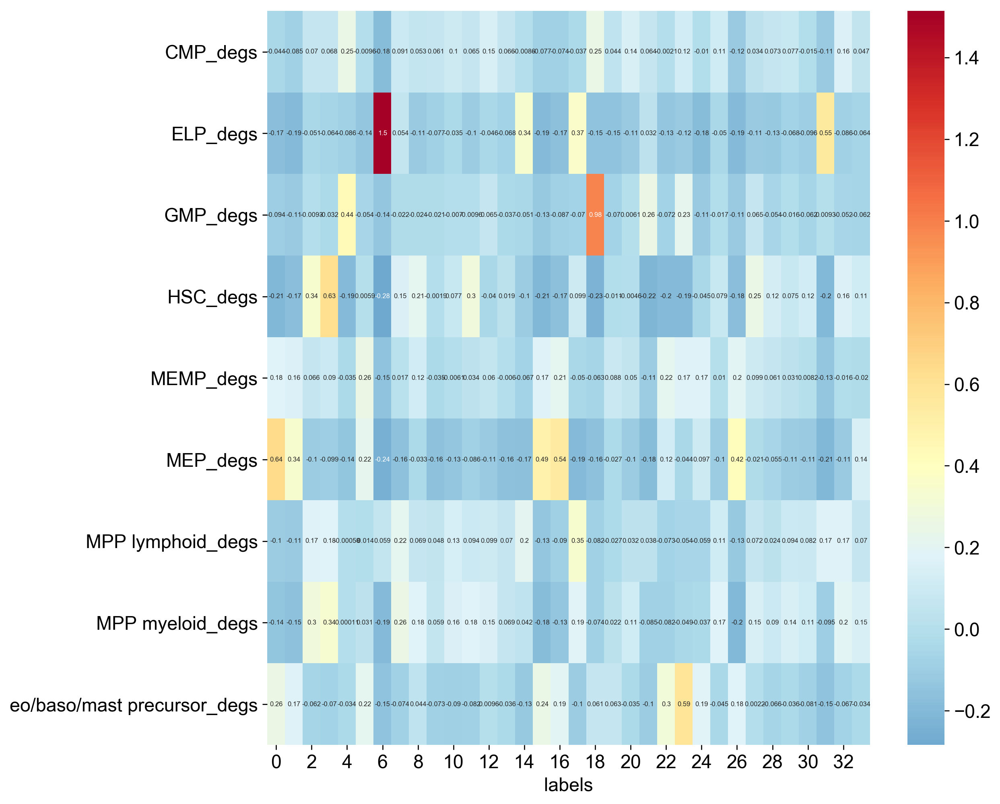

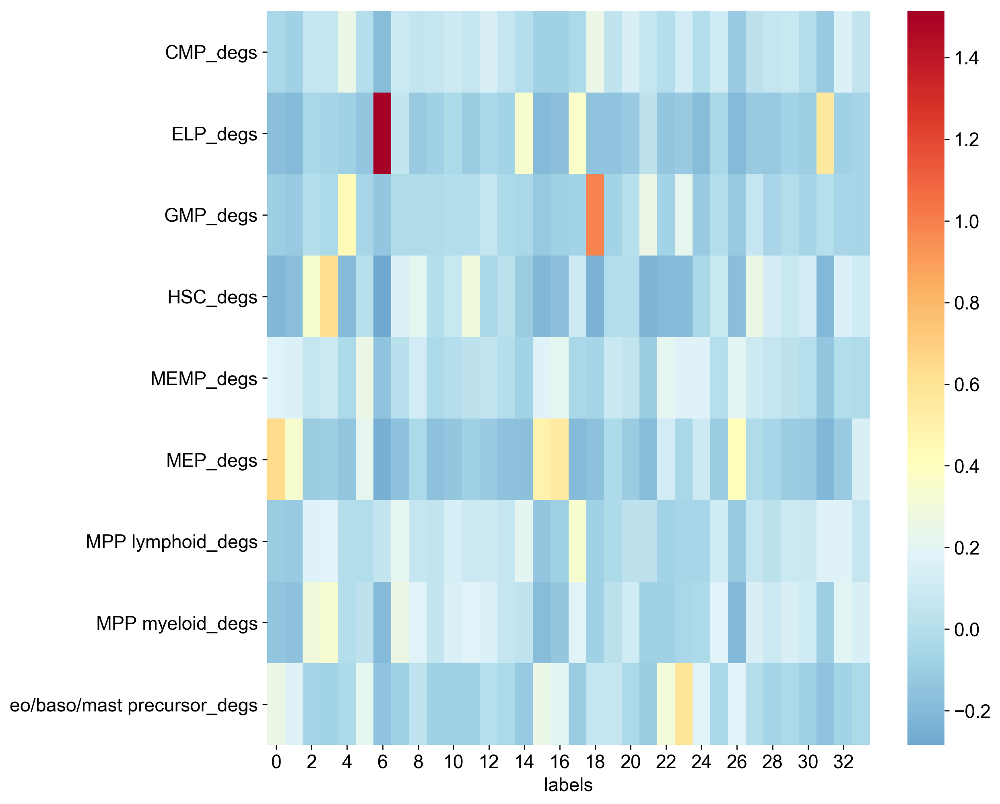

In [53]:
plt.figure(figsize=(10, 10))
fig = sns.heatmap(mean_enrichment_scores_df, annot=True, fmt=".2", center=0.4, annot_kws={"size": 5}, cmap="RdYlBu_r").get_figure()
fig.savefig("figures/figs5c_fl_fbm_progen_comparison_numbers_yes_20200513.pdf")
# plot gene scores as a heatmap. 
plt.figure(figsize=(10, 10))
fig = sns.heatmap(mean_enrichment_scores_df, cmap="RdYlBu_r", center=0.4).get_figure() 
fig.savefig("figures/figs5c_fl_fbm_progen_comparison_numbers_no_20200513.pdf")

In [54]:
adata

AnnData object with n_obs × n_vars = 5015 × 27080 
    obs: 'nGene', 'nUMI', 'orig.ident', 'percent.mito', 'fetal.ids', 'sort.ids', 'tissue', 'lanes', 'stages', 'sample.type', 'gender', 'AnnatomicalPart', 'doublets', 'cell.labels', 'combined.labels', 'batch', 'sample', 'n_counts', 'leiden', '__is_in_cluster__', 'CMP_degs', 'ELP_degs', 'GMP_degs', 'HSC_degs', 'MEMP_degs', 'MEP_degs', 'MPP lymphoid_degs', 'MPP myeloid_degs', 'eo/baso/mast precursor_degs', 'labels'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'cell.labels_colors', 'sample_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'rank_genes_groups_filtered'
    obsm: 'X_fdg', 'X_tsne', 'X_umap', 'X_pca', 'X_orig_pca'
    varm: 'PCs'

# Save data

In [55]:
from scipy.sparse import csr_matrix
adata.X = sparse.csr_matrix(adata.X)

In [56]:
adata.X

<5015x27080 sparse matrix of type '<class 'numpy.float32'>'
	with 12481722 stored elements in Compressed Sparse Row format>

In [57]:
adata.raw.X

<5015x27080 sparse matrix of type '<class 'numpy.float32'>'
	with 17341343 stored elements in Compressed Sparse Row format>

In [58]:
adata.write("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/data/figs5c_fl_fbm_progen_enrichment_comparison_20200513.h5ad")

# Reload and annotate

# Import packages and data 

In [24]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scipy.stats
import anndata
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.axes._axes import _log as matplotlib_axes_logger
from scipy import sparse
matplotlib_axes_logger.setLevel('ERROR')
# silence NumbaPerformanceWarning
import warnings
from numba.errors import NumbaPerformanceWarning
warnings.filterwarnings("ignore", category=NumbaPerformanceWarning)

In [25]:
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
# Set up the plot config for viewing the annotation clearly.
sc.settings.set_figure_params(dpi=120, dpi_save=1000)
sc.logging.print_versions()

scanpy==1.4.4 anndata==0.7.1 umap==0.3.10 numpy==1.18.1 scipy==1.4.1 pandas==1.0.2 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1


# Load the YS progenitors

In [26]:
adata = sc.read("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/data/figs5c_fl_fbm_progen_enrichment_comparison_20200513.h5ad")

In [27]:
adata.shape

(5015, 27080)

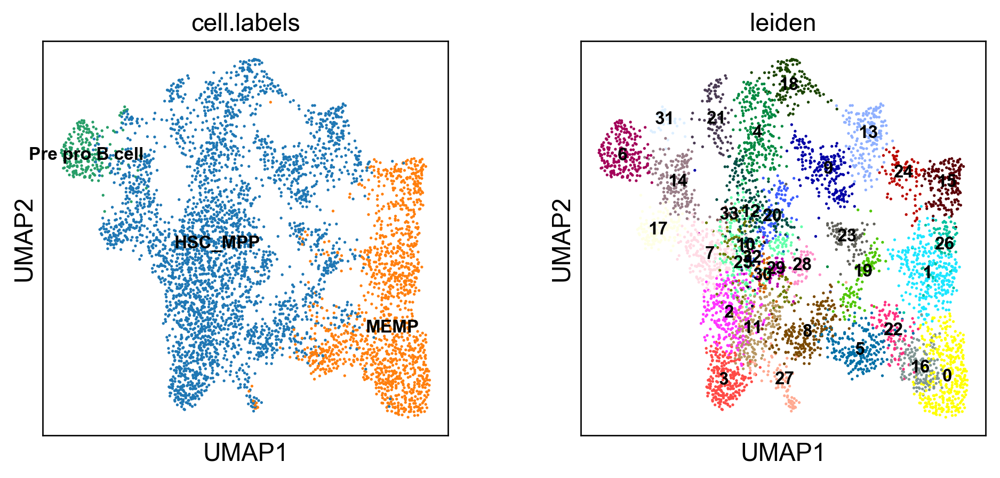

In [28]:
# lets look into proliferation..
sc.pl.umap(adata, color=["cell.labels", "leiden"], legend_loc="on data", legend_fontsize=10, size=10)

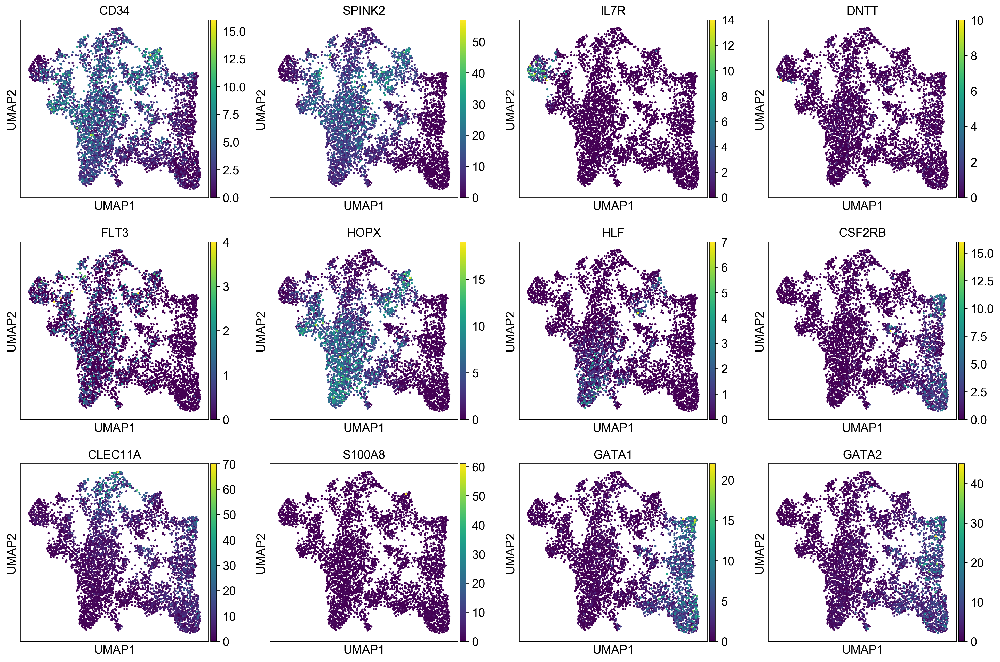

In [29]:
# lets look into proliferation..
sc.pl.umap(adata, color=['CD34', 'SPINK2', 'IL7R', 'DNTT', 'FLT3', 'HOPX', 'HLF', 'CSF2RB', 'CLEC11A', 'S100A8', 'GATA1', 'GATA2'])

In [30]:
# read in annotation.csv which contains: 'Cluster' column for leiden clusters and 'Category' column for annotations
annotation = pd.read_csv("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/resources_for_pipelines/fl_progen_annotation.csv", index_col=False)

In [31]:
# convert the clusters column to a string (so that it can be input into the replace function, which acts on strings)
annotation.Cluster = annotation.Cluster.apply(str)
# make a temp metadata column for new cell labels from the leiden clusters
adata.obs["old_cell.labels"] = adata.obs["cell.labels"]
adata.obs["cell.labels"] = adata.obs["leiden"]

In [32]:
# save the clusters/categories columns as named lists 
clusters = annotation["Cluster"].tolist()
categories = annotation["Category"].tolist()
# replace all values in new.cell.labels column matchin clusters values with categories values
adata.obs["cell.labels"] = adata.obs["cell.labels"].replace(clusters, categories)

... storing 'cell.labels' as categorical


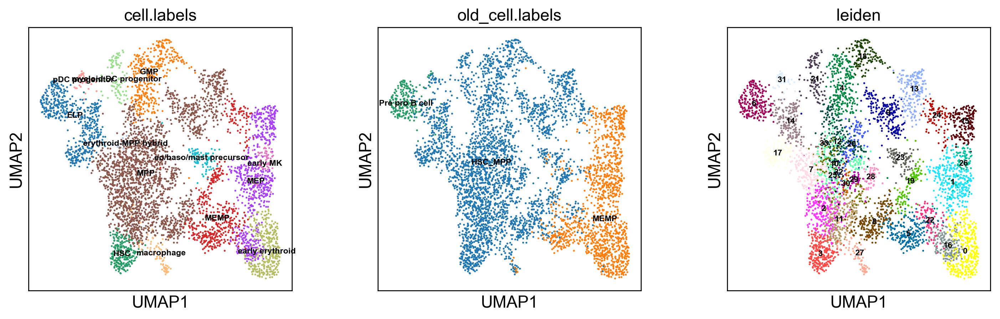

In [33]:
# lets look into proliferation..
sc.pl.umap(adata, color=["cell.labels", "old_cell.labels", "leiden"], legend_loc="on data", legend_fontsize=7, size=10)

In [34]:
cell_numbers = adata.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
ELP                        525
GMP                        362
HSC                        242
MEMP                       505
MEP                        639
MPP                       2012
early MK                    81
early erythroid            333
eo/baso/mast precursor      86
erythroid-MPP hybrid        14
macrophage                  81
myeloid DC progenitor       94
pDC progenitor              41
dtype: int64

In [35]:
adata.write("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/data/figs5c_fl_fbm_progen_enrichment_comparison_20200518.h5ad")

# Load liver progenitors and save metadata

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scipy.stats
import anndata
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.axes._axes import _log as matplotlib_axes_logger
from scipy import sparse
matplotlib_axes_logger.setLevel('ERROR')
# silence NumbaPerformanceWarning
import warnings
from numba.errors import NumbaPerformanceWarning
warnings.filterwarnings("ignore", category=NumbaPerformanceWarning)

In [2]:
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
# Set up the plot config for viewing the annotation clearly.
sc.settings.set_figure_params(dpi=120, dpi_save=1000)
sc.logging.print_versions()

scanpy==1.4.4 anndata==0.7.1 umap==0.3.10 numpy==1.17.1 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1


In [3]:
adata = sc.read("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/data/figs5c_fl_fbm_progen_enrichment_comparison_20200518.h5ad")

In [4]:
pd.DataFrame(adata.obs).to_csv("/Users/b8058304/Documents/PhD_work/Coding/manuscript_figs/resources_for_pipelines/liver_progen_annot_20200605.csv")